## Approach

1. Load data for HET and WT lines
2. Perform QC on the cells
3. Clustering Strategy
4. Annotation of the rest of the samples
5. Marker genes analysis

In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import sys

%matplotlib inline
%load_ext autoreload
%autoreload 2

#import random
#random.seed(30)

import matplotlib as mpl
#mpl.rcParams['figure.figsize'] = (9,6)
#sns.set(rc={'figure.figsize':(9,6)})
sc.set_figure_params(dpi = 300)

prefix = 'paper-data/'
output_prefix = 'paper/'
sc.settings.figdir = output_prefix + 'figs/'




### 1. Load Data

specify paths

In [6]:
from operator import itemgetter

metadata = ["NEU_HE_UNT_C_2", "NEU_HO_UNT_C_2","NEU_WT_UNT_C_1","NEU_WT_ROT_C_1","NEU_WT_TUN_C_1","NEU_HE_UNT_C_1","NEU_HE_ROT_C_1","NEU_HE_TUN_C_1","NEU_HO_UNT_C_1","NEU_HO_ROT_C_1","NEU_HO_TUN_C_1"]
cellranger_ids = [
    "cellranger211_count_26559_5094STDY7599769_GRCh38",
    "cellranger211_count_26559_5094STDY7599770_GRCh38",
    "cellranger211_count_26559_5094STDY7599771_GRCh38",
    "cellranger211_count_26559_5094STDY7599772_GRCh38",
    "cellranger211_count_26559_5094STDY7599773_GRCh38",
    "cellranger211_count_26559_5094STDY7599774_GRCh38",
    "cellranger211_count_26559_5094STDY7599775_GRCh38",
    "cellranger211_count_26559_5094STDY7599776_GRCh38",
    "cellranger211_count_26559_5094STDY7599777_GRCh38",
    "cellranger211_count_26559_5094STDY7599778_GRCh38",
    "cellranger211_count_26559_5094STDY7599779_GRCh38"]

paths = []
for path in cellranger_ids:
    paths.append('cellranger/scrna_neurons3_26559/cellranger/'+path+'/filtered_gene_bc_matrices/GRCh38')
    
samples = dict(zip(metadata,cellranger_ids))


selected_samples = ["NEU_WT_UNT_C_1","NEU_WT_ROT_C_1","NEU_WT_TUN_C_1","NEU_HE_UNT_C_1","NEU_HE_ROT_C_1","NEU_HE_TUN_C_1"]
analysis_samples = {k: v for k,v in samples.items() if k in selected_samples}





In [7]:
analysis_samples = {
    'NEU_WT_UNT_C_1': 'cellranger211_count_26559_5094STDY7599771_GRCh38',
    'NEU_WT_ROT_C_1': 'cellranger211_count_26559_5094STDY7599772_GRCh38',
    'NEU_WT_TUN_C_1': 'cellranger211_count_26559_5094STDY7599773_GRCh38',
    'NEU_HE_UNT_C_1': 'cellranger211_count_26559_5094STDY7599774_GRCh38',
    'NEU_HE_ROT_C_1': 'cellranger211_count_26559_5094STDY7599775_GRCh38',
    'NEU_HE_TUN_C_1': 'cellranger211_count_26559_5094STDY7599776_GRCh38'
}



In [15]:
## Load the samples

sample_objects={}

for sample_case, sample_id in analysis_samples.items():
    print('Loading', sample_case)
    ann_tmp = sc.read_10x_h5('raw/'+sample_id+'/filtered_gene_bc_matrices_h5.h5')
    ann_tmp.var_names_make_unique()
    ann_tmp.obs['sample'] = sample_case
    fields = dict(zip(['cell_type', 'genotype', 'treatment', 'differentiation', 'clone'], list(sample_case.split('_'))))
    for f in ['genotype','treatment']:
        ann_tmp.obs[f] = fields[f]
    ann_tmp.obs['sample'] = fields['genotype'] + '_' + fields['treatment']
    sample_objects[sample_case] = ann_tmp
    sn = ann_tmp.obs['sample'].unique()[0]
    bdf = pd.DataFrame(ann_tmp.X.A.T,columns = ann_tmp.obs_names, index = ann_tmp.var_names)
    bdf.to_csv('raw/external/' + sn  + '.tsv',sep = '\t')
    


Loading NEU_WT_UNT_C_1


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Loading NEU_WT_ROT_C_1


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Loading NEU_WT_TUN_C_1


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Loading NEU_HE_UNT_C_1


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Loading NEU_HE_ROT_C_1


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Loading NEU_HE_TUN_C_1


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


### 2. Perform QC on the dataset

In [5]:
adata_all = sc.AnnData.concatenate(*list(sample_objects.values()), batch_key = 'sample_id')
adata_orig = adata_all
adata_all = adata_all.copy()

no_qc_obs, no_qc_vars = sc.pp.calculate_qc_metrics(adata_all, percent_top = False,inplace=False)

## Perform QC
def preliminaryQC(adata):
    sc.pp.filter_genes(adata, min_counts = 100)
    sc.pp.filter_cells(adata, min_genes = 2000)
    sc.pp.filter_cells(adata, max_counts = 50000)
    sc.pp.filter_genes(adata, min_cells = 10)
    sc.pp.calculate_qc_metrics(adata, percent_top = False, inplace = True)
    
    for group,genes in [('mito', adata.var_names.str.startswith('MT-')),('ribo', adata.var_names.str.startswith('RP'))]:
        gene_sum = adata[:, genes].X.sum(axis = 1). A1
        adata.obs['percent_' + group] = (gene_sum / adata.obs['n_counts'].values)*100
    adata = adata[adata.obs['percent_mito'] <= 12, :]
    adata.obs['max_count'] = adata.X.max(axis = 1).A
    adata.raw = adata.copy()
    sc.pp.normalize_per_cell(adata, counts_per_cell_after = 15000)
    
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata)
    return adata


print(adata_all)

adata_all = preliminaryQC(adata_all)

print(adata_all)


AnnData object with n_obs × n_vars = 18173 × 33694 
    obs: 'genotype', 'sample', 'sample_id', 'treatment'
    var: 'gene_ids'


Trying to set attribute `.obs` of view, making a copy.


AnnData object with n_obs × n_vars = 15325 × 16179 
    obs: 'genotype', 'sample', 'sample_id', 'treatment', 'n_genes', 'n_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'percent_mito', 'percent_ribo', 'max_count'
    var: 'gene_ids', 'n_counts', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'


In [9]:
adata_all.obs.groupby('sample').size()

sample
HE_ROT    3660
HE_TUN    2506
HE_UNT    2753
WT_ROT    1449
WT_TUN    2312
WT_UNT    2645
dtype: int64

### Get QC metrics before and after

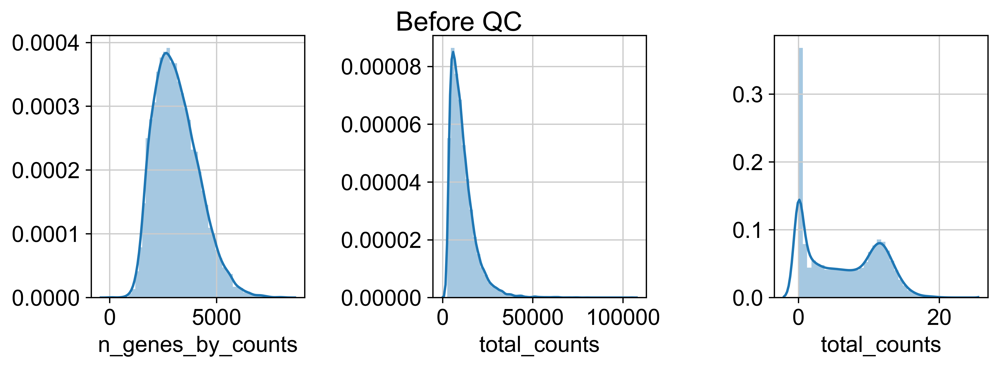

In [53]:
f, ax = plt.subplots(1,3, figsize=(10,3))
plt.subplots_adjust( wspace=0.6)
f.suptitle('Before QC')

sns.distplot(no_qc_obs['n_genes_by_counts'], ax = ax[0])
sns.distplot(no_qc_obs['total_counts'],  ax = ax[1])
sns.distplot(np.log2(no_qc_vars['total_counts'] + 1), ax = ax[2])

f.savefig(output_prefix + 'figs/' + 'before_QC.png')
#adata_all.obs

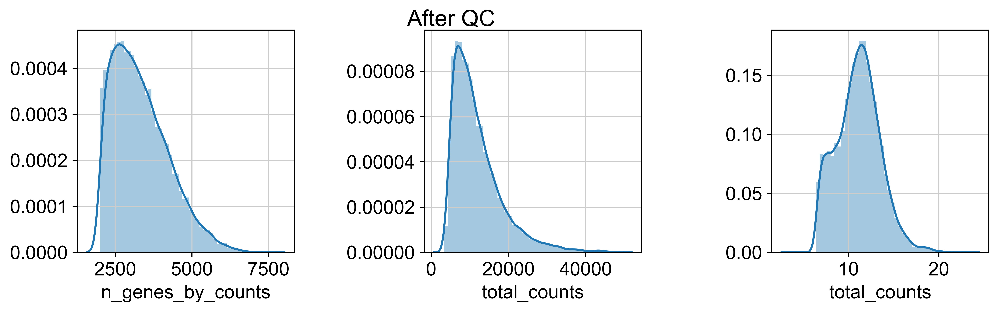

In [54]:
f, ax = plt.subplots(1,3, figsize=(12,3))
plt.subplots_adjust( wspace=0.6)
f.suptitle('After QC')


sns.distplot(adata_all.obs['n_genes_by_counts'], ax = ax[0])
sns.distplot(adata_all.obs['total_counts'],  ax = ax[1])
sns.distplot(np.log2(adata_all.var['total_counts'] + 1), ax = ax[2])


f.savefig(output_prefix + 'figs/' + 'after_QC.png')

#adata_all.obs

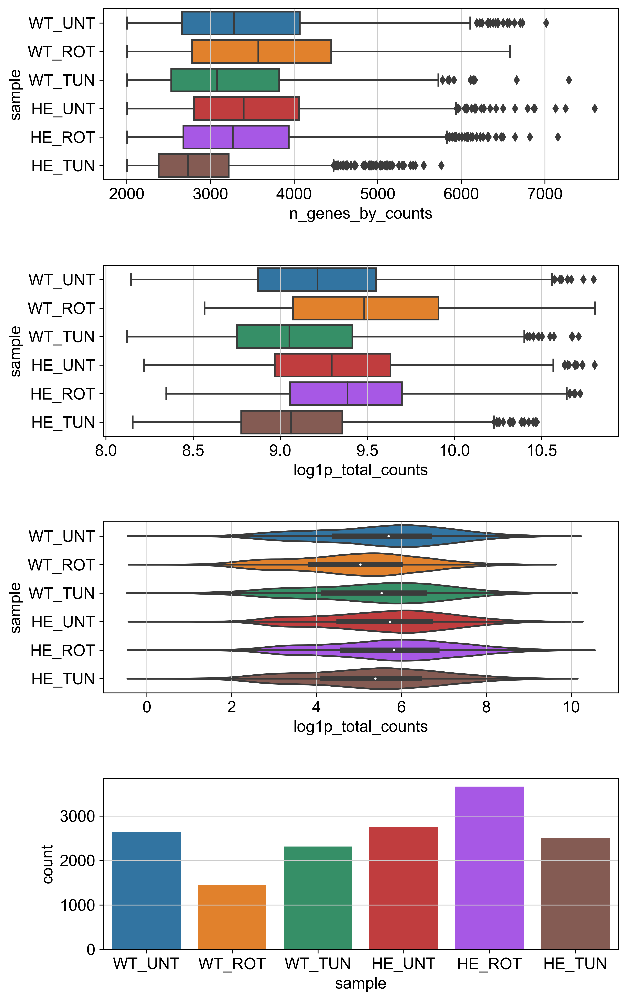

In [55]:
## Look into specific samples
f, ax = plt.subplots(4,1,figsize=(8,15))
plt.subplots_adjust( hspace=0.5)
sns.boxplot(data=adata_all.obs, y = 'sample', x = 'n_genes_by_counts', orient = 'h', ax = ax[0])
sns.boxplot(data=adata_all.obs, y = 'sample', x = 'log1p_total_counts', orient = 'h', ax = ax[1])
#sample_objects_copy = {treat: obj.copy() for treat , obj in sample_objects.items()}
sample_vars = []

for s in adata_all.obs['sample'].unique():
    ada = adata_all[adata_all.obs['sample'] == s]
    obs_metrics, var_metrics = sc.pp.calculate_qc_metrics(ada, percent_top = False, inplace = False)
    var_metrics['sample'] = s
    sample_vars.append(var_metrics)

all_var = pd.concat(sample_vars)

sns.violinplot(data= all_var, y = 'sample', x = 'log1p_total_counts', ax = ax[2])

sns.countplot(x="sample", data=adata_all.obs, ax = ax[3])

f.savefig('QC-samples-metrics.png')

### 3. Cluster and annotate template sample Wild Type untreated


In [1]:

def analyze(adata):
    sc.pp.highly_variable_genes(adata)
    sc.pp.pca(adata, use_highly_variable= True, n_comps=100)
    sc.pp.neighbors(adata, n_pcs = 50)
    sc.tl.umap(adata)
    sc.tl.louvain(adata, resolution = 0.4)
    sc.tl.diffmap(adata)
    adata.uns['iroot'] = np.argmin(adata.obsm['X_umap'][:,0])
    sc.tl.dpt(adata)


ann_model = adata_all[adata_all.obs['sample'] == 'WT_UNT'].copy()
analyze(ann_model)





merge_clusters(ann_model, ['0','2'])
#sns.set_context('poster')
aliases_context = {'0.2':'SNpc-A9', 
           '1': 'Progenitors', 
           '3': 'FPP/Astro', 
           '4' : 'VTA-A10', 
           '5': 'Serotonergic', 
           '6':'Gabaergic',
           '7': 'Glutamatergic'}

aliases = {'0.2':'DAn1', 
           '1': 'Prog2', 
           '3': 'Prog1', 
           '4' : 'DAn5', 
           '5': 'DAn2', 
           '6':'DAn4',
           '7': 'DAn3'}

... storing 'genotype' as categorical
... storing 'sample' as categorical
... storing 'treatment' as categorical


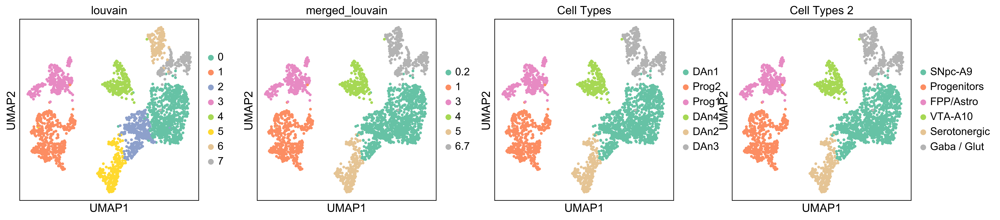

In [57]:
output_tag = 'merged_louvain'

def merge_clusters(adata_work, clusters, output_tag, tag = 'louvain'):
    cat = adata_work.obs[tag].astype(str)
    cells_found = cat.isin(clusters)
    cat[cells_found] = '.'.join(clusters)
    adata_work.obs[output_tag] = cat.astype('category')
    return adata_work


merge_clusters(ann_model, ['0','2'], output_tag)
merge_clusters(ann_model, ['6', '7'], output_tag, tag = output_tag)
#sns.set_context('poster')
aliases_context = {'0.2':'SNpc-A9', 
           '1': 'Progenitors', 
           '3': 'FPP/Astro', 
           '4' : 'VTA-A10', 
           '5': 'Serotonergic', 
           '6.7':'Gaba / Glut'
    }

aliases = {'0.2':'DAn1', 
           '1': 'Prog2', 
           '3': 'Prog1', 
           '4' : 'DAn4', 
           '5': 'DAn2', 
           '6.7':'DAn3'
          }





ann_model.obs['Cell Types'] = ann_model.obs[output_tag].cat.rename_categories(aliases)

ann_model.obs['Cell Types 2'] = ann_model.obs[output_tag].cat.rename_categories(aliases_context)

sc.pl.umap(ann_model, color = ['louvain', output_tag, 'Cell Types', 'Cell Types 2'], palette = 'Set2', save = 'wt-unt-representation.pdf')


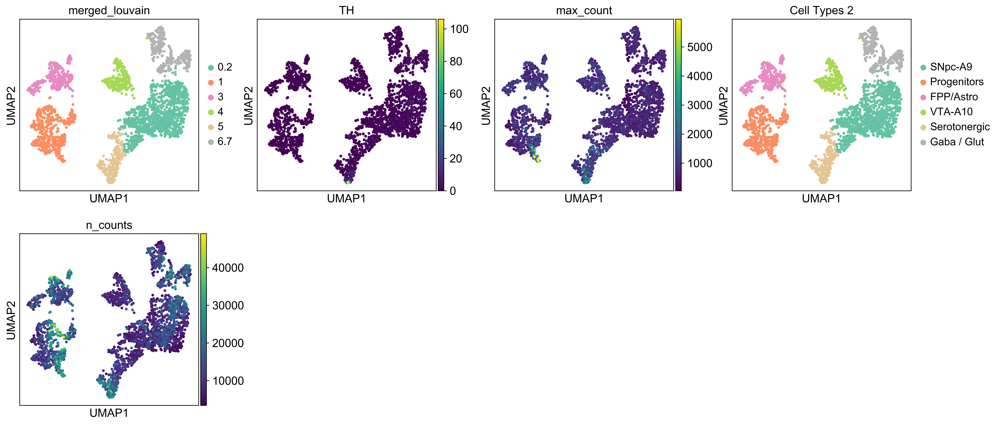

In [58]:
sc.pl.umap(ann_model, color = [output_tag, 'TH','max_count', 'Cell Types 2','n_counts'], palette = 'Set2', save = 'wt-unt-representation.pdf')
ann_model.write(prefix + 'model-dataset.h5ad')


## Train the model

In [40]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix


X = ann_model[:,ann_model.var.highly_variable].X.A
print(X.shape)
y = ann_model.obs['Cell Types']
cross_validation = KFold(n_splits = 5)
score = 0
lr_best = None
for train, test in cross_validation.split(X):
    X_train, X_test = X[train], X[test]
    y_train, y_test = y[train], y[test]
    lr = LogisticRegression(solver = 'lbfgs', max_iter = 1000, multi_class = 'auto')
    lr.fit(X_train, y_train)
    prediction = lr.predict(X_test)
    lr_score = lr.score(X_test,y_test)
    if lr_score > score:
        score = lr_score
        lr_best = lr
    print(int(lr_score*1000)/10.0,'% accuracy')
    print(confusion_matrix(y_test, prediction))



(2645, 1806)
98.1 % accuracy
[[202   1   4   0   0   0]
 [  1  46   0   0   0   0]
 [  0   0  78   0   0   0]
 [  2   0   0  47   0   0]
 [  0   0   0   0  60   0]
 [  1   0   0   0   1  86]]
97.9 % accuracy
[[205   0   3   1   1   0]
 [  2  54   0   0   0   0]
 [  1   0  72   0   0   0]
 [  0   0   1  49   0   0]
 [  0   0   0   0  52   1]
 [  0   0   0   0   1  86]]
99.6 % accuracy
[[216   0   1   0   0   0]
 [  0  47   0   0   0   0]
 [  1   0  57   0   0   0]
 [  0   0   0  49   0   0]
 [  0   0   0   0  52   0]
 [  0   0   0   0   0 106]]
98.8 % accuracy
[[201   0   1   0   0   0]
 [  2  40   0   0   0   0]
 [  3   0  63   0   0   0]
 [  0   0   0  49   0   0]
 [  0   0   0   0  63   0]
 [  0   0   0   0   0 107]]
96.7 % accuracy
[[205   3   3   0   0   1]
 [  2  43   0   0   0   0]
 [  3   0  62   1   0   0]
 [  3   0   0  48   0   0]
 [  1   0   0   0  63   0]
 [  0   0   0   0   0  91]]


In [41]:
adata_final = adata_all.copy()
X = adata_final[:,ann_model.var.highly_variable].X.A
#for ada in adata_all.obs['sample'].unique():
adata_final.obs['Cell Type Classification'] = lr_best.predict(X)
analyze(adata_final)

#ann_model.varm.keys()   
    

C:\Users\patou\Anaconda-p3.7\envs\py36\lib\site-packages\numba\compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\AppData\Roaming\Python\Python36\site-packages\umap\nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


## Project the final population

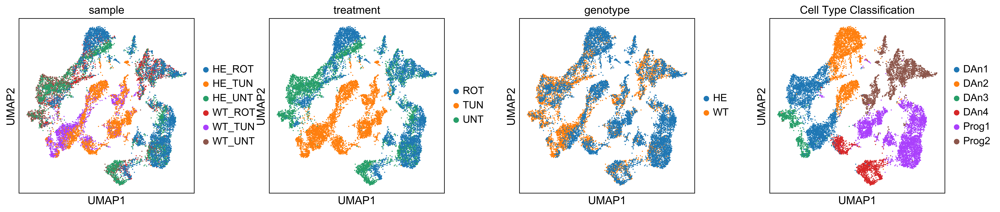

In [45]:
sc.pl.umap(adata_final, color =['sample', 'treatment','genotype', 'Cell Type Classification', ], wspace = 0.3,save = '')

In [46]:

adata_final.write(prefix + 'full-dataset.h5ad')




'paper-data/full-dataset.h5ad'